# Check the lmer function in R

In [1]:
%matplotlib notebook
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.mlab as mlab
import numpy as np
import matplotlib.cm as cm
import pandas as pd
import matplotlib.colors as mcol
from numba import jit


### - Create the data

In [2]:
# Create x array
x1 = 100*np.random.rand(100)
x2 = 100*np.random.rand(100)
x3 = 100*np.random.rand(100)
x4 = 200*np.random.rand(100)


xx1 = 3 + 4*np.random.rand(100)
xx2 = 3 + 4*np.random.rand(100)
xx3 = 3 + 4*np.random.rand(100)
xx4 = 3 + 4*np.random.rand(100)


# Create y array
# F(x) = log(x) + 10
offset = 1.0
offset2 = 4.5

def func(x, offset, offset2, norm):
    
    # Example
    y = 3.5*np.log(x+offset) + 0.1*x + 2.5*np.sqrt(x+offset2)
    
    # Source term in BSSA14
    #y = 1.0 + 1.25*(x-offset) - 0.1*(x-offset)**2
    
    # Path term in BSSA14
    #y = (-1.5 + 0.2*(5.0-offset2))*np.log(x/offset) - 0.008*(x-offset)
    
    # Add the random noise
    for i in range(len(y)):
        y[i] = y[i] + 2*np.random.rand(1) 
    
    # Add the random effects
    mix = norm*np.random.rand(1)
    y = y + mix
    
    return y, mix

y1, mix1 = func(x1, offset, offset2, 10); y2, mix2 = func(x2, offset, offset2, 5)
y3, mix3 = func(x3, offset, offset2, -10); y4, mix4 = func(x4, offset, offset2, -5)
y4 = y4 + 40

l1 = np.array(['black']*100)
l2 = np.array(['red']*100)
l3 = np.array(['blue']*100)
l4 = np.array(['green']*100)


    
# Combine all different group data
x = np.append(x1, x2); x = np.append(x, x3); x = np.append(x, x4)
y = np.append(y1, y2); y = np.append(y, y3); y = np.append(y, y4)
l = np.append(l1, l2); l = np.append(l, l3); l = np.append(l, l4)

#v1 = np.log(x+offset)
#v2 = np.sqrt(x+offset2)

#v1 = x-offset
#v2 = (x-offset)**2
# For instance
#v3 = v2

v1 = np.log(x/offset)
v2 = (5.0-offset2)* v1
v3 = (x-offset)


# Convert to pandas data frame
array = np.c_[x, y, v1, v2, v3, l]
Table = pd.DataFrame(array)
Table.columns = ['x', 'y', 'v1', 'v2', 'v3', 'group']
Table.to_csv('ex_data.csv')

print('mix = ', mix1, mix2, mix3, mix4)
print(-1.5 + 0.2*(5.0-offset2))


mix =  [ 2.86643833] [ 0.62159466] [-9.91128436] [-0.52793404]
-1.4


### - Plot the figure

<IPython.core.display.Javascript object>


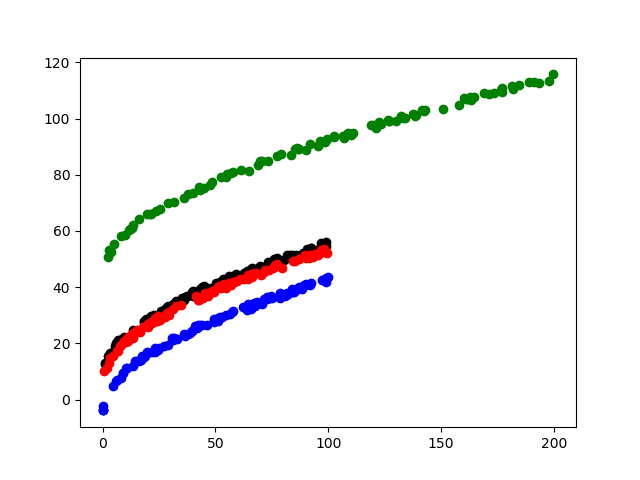

In [3]:
fig = plt.figure()
plt.plot(x1, y1, 'ko')
plt.plot(x2, y2, 'ro')
plt.plot(x3, y3, 'bo')
plt.plot(x4, y4, 'go')

plt.rcParams['font.size'] = 14

plt.show()

## - Check the GMPE refitting

In [4]:
# Create PGA data using BSSA14
def func(M, Mh, Mref, Rref, h, cref, eref):
    
    # Create distance array
    num_st = int(5 + 30*np.random.rand(1))
    # Even distributed
    Rjb = 10**(np.log10(np.random.rand(num_st)))
    # Weight distributed
    Rjb = 400*np.random.rand(num_st)
    R = np.sqrt(Rjb**2 + h**2)
    
    e0 = eref[0]; e4 = eref[1]; e5 = eref[2]
    c1 = cref[0]; c2 = cref[1]; c3 = cref[2]
    
    # Complete form of BSSA14
    y = e0 + e4*(M-Mh) + e5*(M-Mh)**2 + (c1 + c2*(M-Mref))*np.log(R/Rref) + c3*(R-Rref)
    
    # Add the random noise
    for i in range(len(y)):
        y[i] = y[i] + 2.0*(np.random.rand(1) - 0.5)
    
    # Add the random effects
    mix = 2.0*(np.random.rand(1) - 0.5)  # Distributed between -0.5 and 0.5
    y = y + mix
    
    return y, Rjb, mix, num_st


# Create dataset 
def createData(num_ev, coefref):
    # Create event array
    # Even distributed
    #Mlist = 3.0 + 2.5*np.random.rand(num_ev)
    # Weight distributed
    Mlist = 3.0 + 1.0*np.random.randn(num_ev)
    # Select the events only 3.0 < M < 5
    Mlist = Mlist[np.where((Mlist>=3.0) & (Mlist<=5.5))]
    num_ev = len(Mlist)

    # Parameters
    Mh = 5.5; Mref = 4.5
    Rref = 1.0; h = 4.5
    eref = coefref[0:3]
    cref = coefref[3:6]
    for i in range(len(Mlist)):
        if (i==0):
            ybin, Rjbbin, mix, num_st = func(Mlist[i], Mh, Mref, Rref, h, cref, eref)
            labelbin = np.array([i]*num_st)
            Mbin = np.array([Mlist[i]]*num_st)
            mixbin = np.array([mix]*num_st)
            y = ybin
            Rjb = Rjbbin
            label = labelbin
            M = Mbin
            Random = mixbin

        if (i>=1):
            ybin, Rjbbin, mix, num_st = func(Mlist[i], Mh, Mref, Rref, h, cref, eref)
            labelbin = np.array([i]*num_st)
            Mbin = np.array([Mlist[i]]*num_st)
            mixbin = np.array([mix]*num_st)
            y = np.append(y,ybin)
            Rjb = np.append(Rjb,Rjbbin)
            label = np.append(label,labelbin)
            M = np.append(M,Mbin)
            Random = np.append(Random,mixbin)


    # Remove the data partially
    
    cut = np.where(((M<4.5) | (Rjb>10.0)) & (Rjb>1.0))
    y = y[cut]
    label = label[cut]
    M = M[cut]
    Random = Random[cut]
    Rjb = Rjb[cut]
    

    # Create variable table
    me4 = M-Mh
    me5 = (M-Mh)**2
    R = np.sqrt(Rjb**2+h**2)
    rc1 = np.log(R/Rref)
    rc2 = (M-Mref)* rc1
    rc3 = (R-Rref)


    # Convert to pandas data frame
    array = np.c_[Rjb, y, M, me4, me5, rc1, rc2, rc3, label, Random]
    Table = pd.DataFrame(array)
    Table.columns = ['Rjb', 'y', 'M', 'me4', 'me5', 'rc1', 'rc2', 'rc3', 'label', 'Random']
    #Table.to_csv('ex_BSSA14data.csv')
    
    return Table


## - Create data set from the data distribution in Saudi's case

In [5]:
# Create PGA data using BSSA14
def func2(M, Rjb, Mh, Mref, Rref, h, cref, eref):
    R = np.sqrt(Rjb**2 + h**2)
    
    e0 = eref[0]; e4 = eref[1]; e5 = eref[2]
    c1 = cref[0]; c2 = cref[1]; c3 = cref[2]
    
    # Complete form of BSSA14
    y = e0 + e4*(M-Mh) + e5*(M-Mh)**2 + (c1 + c2*(M-Mref))*np.log(R/Rref) + c3*(R-Rref)
    
    # Add the random noise
    for i in range(len(y)):
        y[i] = y[i] + 3.0*(np.random.rand(1) - 0.5)
    
    # Add the random effects
    mix = 2.0*(np.random.rand(1) - 0.5)  # Distributed between -0.5 and 0.5
    y = y + mix
    
    return y, mix


def createPGA(coefref):
    
    Mh = 5.5; Mref = 4.5
    Rref = 1.0; h = 4.5
    eref = coefref[0:3]
    cref = coefref[3:6]
    
    # Get the data distribution
    data = pd.read_csv('AllTable.csv')
    Min = np.array(data['Mag'])
    Rjbin = np.array(data['Rjb'])
    EQlist = np.array(data['EventID'])
    Evlabel = np.unique(EQlist)

    for i in range(len(Evlabel)):
        select = np.where(EQlist==Evlabel[i])
        Mbin = Min[select]
        Rjbbin = Rjbin[select]

        if (i==0):
            ybin, mix = func2(Mbin, Rjbbin, Mh, Mref, Rref, h, cref, eref)
            mixbin = np.array([mix]*len(Rjbbin))
            labelbin = np.array([i]*len(Rjbbin))
            y = ybin
            Rjb = Rjbbin
            label = labelbin
            M = Mbin
            Random = mixbin

        if (i>=1):
            ybin, mix = func2(Mbin, Rjbbin, Mh, Mref, Rref, h, cref, eref)
            mixbin = np.array([mix]*len(Rjbbin))
            labelbin = np.array([i]*len(Rjbbin))
            y = np.append(y,ybin)
            Rjb = np.append(Rjb,Rjbbin)
            label = np.append(label,labelbin)
            M = np.append(M,Mbin)
            Random = np.append(Random,mixbin)
            

    # Create variable table
    me4 = M-Mh
    me5 = (M-Mh)**2
    R = np.sqrt(Rjb**2+h**2)
    rc1 = np.log(R/Rref)
    rc2 = (M-Mref)* rc1
    rc3 = (R-Rref)


    # Convert to pandas data frame
    array = np.c_[Rjb, y, M, me4, me5, rc1, rc2, rc3, label, Random]
    Table = pd.DataFrame(array)
    Table.columns = ['Rjb', 'y', 'M', 'me4', 'me5', 'rc1', 'rc2', 'rc3', 'label', 'Random']
    Table.to_csv('ex_BSSA14data.csv')
    
    return Table



In [120]:
# Create PGA data using BSSA14
def func3(M, Rjb, Mh, Mref, Rref, h, cref, eref):
    R = np.sqrt(Rjb**2 + h**2)
    
    e0 = eref[0]; e4 = eref[1]; e5 = eref[2]
    c1 = cref[0]; c2 = cref[1]; c3 = cref[2]
    
    # Complete form of BSSA14
    y = e0 + e4*(M-Mh) + e5*(M-Mh)**2 + (c1 + c2*(M-Mref))*np.log(R/Rref) + c3*(R-Rref)
    
    # Add the random noise
    for i in range(len(y)):
        y[i] = y[i] + 0.5*(np.random.rand(1) - 0.5)
    
    return y


def createPGA2(coefref):
    
    Mh = 5.5; Mref = 4.5
    Rref = 1.0; h = 4.5
    eref = coefref[0:3]
    cref = coefref[3:6]
    
    # Get the data distribution
    data = pd.read_csv('AllTable.csv')
    M = np.array(data['Mag'])
    Rjb = np.array(data['Rjb'])
    EQlist = np.array(data['EventID'])
    STlist = np.array(data['Station'])
    Evlabel = np.unique(EQlist)
    Stlabel = np.unique(STlist) 
    
    
    # Calculate PGA
    y = func3(M, Rjb, Mh, Mref, Rref, h, cref, eref)
    event = np.zeros(len(y))
    site = np.zeros(len(y))
    ev_random = np.zeros(len(y))
    st_random = np.zeros(len(y))
    
    # Add random noise
    for i in range(len(Evlabel)):
        select = np.where(EQlist==Evlabel[i])
        random = 2.0*(np.random.rand(1) - 0.5)
        y[select] = y[select] + random
        ev_random[select] = random
        event[select] = i
        
    for i in range(len(Stlabel)):
        select = np.where(STlist==Stlabel[i])
        random = 2.0*(np.random.rand(1) - 0.5)
        y[select] = y[select] + random
        st_random[select] = random
        site[select] = i
            

    # Create variable table
    me4 = M-Mh
    me5 = (M-Mh)**2
    R = np.sqrt(Rjb**2+h**2)
    rc1 = np.log(R/Rref)
    rc2 = (M-Mref)* rc1
    rc3 = (R-Rref)


    # Convert to pandas data frame
    array = np.c_[Rjb, y, M, me4, me5, rc1, rc2, rc3, event, site, ev_random, st_random]
    Table = pd.DataFrame(array)
    Table.columns = ['Rjb', 'y', 'M', 'me4', 'me5', 'rc1', 'rc2', 'rc3', 'event', 'site', 'ev_random', 'st_random']
    Table.to_csv('ex_BSSA14data.csv')
    
    return Table




## - Mixed effect analysis at R 

In [121]:
import pyper
@jit
def MixedEffect(Table):
    # Pass the data table to R
    r = pyper.R(use_pandas='True')
    r.assign("data", Table)
    r("source(file='fit.R')")
    
    # Get fitting result from R
    coef = r.get('coef')
    ranef = pd.DataFrame(r.get('ranef'))

    return coef, ranef


In [122]:
import pyper
@jit
def MixedEffect2(Table):
    # Pass the data table to R
    r = pyper.R(use_pandas='True')
    r.assign("data", Table)
    r("source(file='fit2.R')")
    
    # Get fitting result from R
    coef = r.get('coef')
    coef_wt = r.get('coef_wt')
    coef_iwt = r.get('coef_iwt')
    coefM = r.get('coefM')
    coefM_wt = r.get('coefM_wt')
    coefM_iwt = r.get('coefM_iwt')
    var_ev = r.get('var_ev')
    var_ev_wt = r.get('var_ev_wt')
    var_ev_iwt = r.get('var_ev_iwt')
    var_st = r.get('var_st')
    var_st_wt = r.get('var_st_wt')
    var_st_iwt = r.get('var_st_iwt')
    varM_ev = r.get('varM_ev')
    varM_ev_wt = r.get('varM_ev_wt')
    varM_ev_iwt = r.get('varM_ev_iwt')
    varM_st = r.get('varM_st')
    varM_st_wt = r.get('varM_st_wt')
    varM_st_iwt = r.get('varM_st_iwt')



    return coef, coef_wt, coef_iwt, coefM, coefM_wt, coefM_iwt, var_ev, var_ev_wt, var_ev_iwt, var_st, var_st_wt, var_st_iwt, varM_ev, varM_ev_wt, varM_ev_iwt, varM_st, varM_st_wt, varM_st_iwt


## - Run multiple times

In [123]:
# Input coefficient
coefref = [1.0, 1.25, -0.1, -1.5, 0.15, -0.008]  # [e0, e4, e5, c1, c2, c3]
coefrefM = [1.0, 1.25, -0.1, 0.15]   #[e0, e4, e5, c2]
# No c2 part
#coefref = [1.0, 1.25, -0.1, -1.5, 0.0, -0.008]  # [e0, e4, e5, c1, c2, c3]
coefref_div = [1.0, 1.25, -0.1, -1.5, 0.2, -0.008]

eref = coefref[0:3]
cref = coefref[3:6]

# The number of events in each iteration
num_ev = 400

# How many times of iteration
iteration = 200
coef = np.zeros((iteration,6))
coef_wt = np.zeros((iteration,6))
coef_iwt = np.zeros((iteration,6))
coefM = np.zeros((iteration,4))
coefM_wt = np.zeros((iteration,4))
coefM_iwt = np.zeros((iteration,4))
normdif = np.zeros((iteration,6))
normdif_wt = np.zeros((iteration,6))
normdif_iwt = np.zeros((iteration,6))
normdifM = np.zeros((iteration,4))
normdifM_wt = np.zeros((iteration,4))
normdifM_iwt = np.zeros((iteration,4))
var_ev = np.zeros((iteration,6))
var_ev_wt = np.zeros((iteration,6))
var_ev_iwt = np.zeros((iteration,6))
var_st = np.zeros(iteration)
var_st_wt = np.zeros(iteration)
var_st_iwt = np.zeros(iteration)
varM_ev = np.zeros((iteration,6))
varM_ev_wt = np.zeros((iteration,6))
varM_ev_iwt = np.zeros((iteration,6))
varM_st = np.zeros(iteration)
varM_st_wt = np.zeros(iteration)
varM_st_iwt = np.zeros(iteration)



for i in (range(iteration)):
    print(i)
    # Create data set
    #Table = createData(num_ev, coefref)
    # Run mixed effect regression
    #coef[i], ranef = MixedEffect(Table)
    
    # Create data set using Saudi's case
    Table = createPGA2(coefref)
    # Run mixed effect regression
    coef[i], coef_wt[i], coef_iwt[i], coefM[i], coefM_wt[i], coefM_iwt[i], var_ev[i], var_ev_wt[i], var_ev_iwt[i], var_st[i], var_st_wt[i], var_st_iwt[i], varM_ev[i], varM_ev_wt[i], varM_ev_iwt[i], varM_st[i], varM_st_wt[i], varM_st_iwt[i] = MixedEffect2(Table)
    
    if (coefref[4] == 0):
        normdif[i] = (coefref - coef[i]) / coefref_div
        normdif_wt[i] = (coefref - coef_wt[i]) / coefref_div
        normdif_iwt[i] = (coefref - coef_iwt[i]) / coefref_div
    else:
        normdif[i] = (coefref - coef[i]) / coefref
        normdif_wt[i] = (coefref - coef_wt[i]) / coefref
        normdif_iwt[i] = (coefref - coef_iwt[i]) / coefref
        
    normdifM[i] = (coefrefM - coefM[i]) / coefrefM
    normdifM_wt[i] = (coefrefM - coefM_wt[i]) / coefrefM
    normdifM_iwt[i] = (coefrefM - coefM_iwt[i]) / coefrefM
    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199


<IPython.core.display.Javascript object>


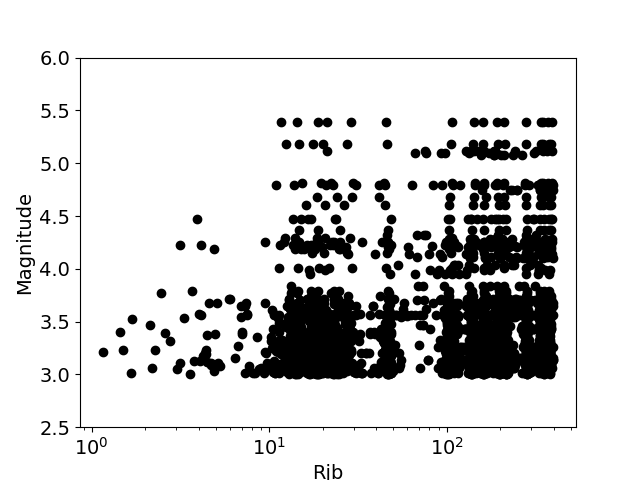

In [85]:
# Input for the figure
fig = plt.figure()
plt.plot(Table['Rjb'], Table['M'], 'ko')

plt.xscale('log') 
plt.rcParams['font.size'] = 14
plt.xlabel('Rjb')
plt.ylabel('Magnitude')
plt.ylim(2.5,6)

plt.show()

fig.savefig("Data_Distribution.png")

## - Plot histogram

In [86]:
# Plot the distribution of absolute values
from plotly.offline import iplot, init_notebook_mode
import plotly.plotly as py
import plotly.graph_objs as go
import cufflinks as cf

init_notebook_mode(connected=True) 
cf.set_config_file(offline=True, theme='pearl')

'''
df = pd.DataFrame({'e0': coef[:,0],
                   'e4': coef[:,1],
                   'e5': coef[:,2],
                   'c1': coef[:,3],
                   'c2' : coef[:,4],
                   'c3': coef[:,5]
                  })

# IPython notebook
#iplot(plot_data, filename='pandas/simple-histogram')
#fig1 = go.Figure(data=df)
layout1 = go.Layout(title = 'Data Histogram',
                    width = 1000, height = 1000,
                    xaxis4 = dict(title = 'e0', range = [-1.0, 3.0]),
                    yaxis4 = dict(title = 'Frequency', range = [0,30]),
                    xaxis5 = dict(title = 'e4', range = [-1.0, 3.0]),
                    yaxis5 = dict(title = 'Frequency', range = [0,30]),
                    xaxis6 = dict(title = 'e5', range = [-0.4, 0.2]),
                    yaxis6 = dict(title = 'Frequency', range = [0,30]),
                    xaxis1 = dict(title = 'c1', range = [-2.0, -1.0]),
                    yaxis1 = dict(title = 'Frequency', range = [0,30]),
                    xaxis2 = dict(title = 'c2', range = [-0.2, 0.8]),
                    yaxis2 = dict(title = 'Frequency', range = [0,30]),
                    xaxis3 = dict(title = 'c3', range = [-0.009, -0.007]),
                    yaxis3 = dict(title = 'Frequency', range = [0,30])
                   )

df.iplot(kind='histogram', barmode='stack', layout=layout1, bins=20, subplots=True, shape=(2,3), filename='cufflinks/multiple-histogram-subplots')
'''



"\ndf = pd.DataFrame({'e0': coef[:,0],\n                   'e4': coef[:,1],\n                   'e5': coef[:,2],\n                   'c1': coef[:,3],\n                   'c2' : coef[:,4],\n                   'c3': coef[:,5]\n                  })\n\n# IPython notebook\n#iplot(plot_data, filename='pandas/simple-histogram')\n#fig1 = go.Figure(data=df)\nlayout1 = go.Layout(title = 'Data Histogram',\n                    width = 1000, height = 1000,\n                    xaxis4 = dict(title = 'e0', range = [-1.0, 3.0]),\n                    yaxis4 = dict(title = 'Frequency', range = [0,30]),\n                    xaxis5 = dict(title = 'e4', range = [-1.0, 3.0]),\n                    yaxis5 = dict(title = 'Frequency', range = [0,30]),\n                    xaxis6 = dict(title = 'e5', range = [-0.4, 0.2]),\n                    yaxis6 = dict(title = 'Frequency', range = [0,30]),\n                    xaxis1 = dict(title = 'c1', range = [-2.0, -1.0]),\n                    yaxis1 = dict(title = 'Freq

In [87]:
# Plot the distribution of normalized differences from input values

'''
from plotly.offline import iplot, init_notebook_mode
import plotly.plotly as py
import plotly.graph_objs as go
import cufflinks as cf

init_notebook_mode(connected=True) 
cf.set_config_file(offline=True, theme='pearl')

df = pd.DataFrame({'e0': normdif[:,0],
                   'e4' : normdif[:,1],
                   'e5': normdif[:,2],
                   'c1': normdif[:,3],
                   'c2' : normdif[:,4],
                   'c3': normdif[:,5]
                  })

# IPython notebook
#iplot(plot_data, filename='pandas/simple-histogram')
#fig1 = go.Figure(data=df)
layout1 = go.Layout(title = 'Data Histogram',
                    width = 1000, height = 1000,
                    xaxis4 = dict(title = 'e0', range = [-1.0, 1.0]),
                    yaxis4 = dict(title = 'Frequensy', range = [0,30]),
                    xaxis5 = dict(title = 'e4', range = [-1.0, 1.0]),
                    yaxis5 = dict(title = 'Frequensy', range = [0,30]),
                    xaxis6 = dict(title = 'e5', range = [-1.0, 1.0]),
                    yaxis6 = dict(title = 'Frequensy', range = [0,30]),
                    xaxis1 = dict(title = 'c1', range = [-1.0, 1.0]),
                    yaxis1 = dict(title = 'Frequensy', range = [0,30]),
                    xaxis2 = dict(title = 'c2', range = [-1.0, 1.0]),
                    yaxis2 = dict(title = 'Frequensy', range = [0,30]),
                    xaxis3 = dict(title = 'c3', range = [-1.0, 1.0]),
                    yaxis3 = dict(title = 'Frequensy', range = [0,30])
                   )

df.iplot(kind='histogram', barmode='stack', layout=layout1, bins=20, subplots=True, shape=(2,3), filename='cufflinks/multiple-histogram-subplots')

'''



"\nfrom plotly.offline import iplot, init_notebook_mode\nimport plotly.plotly as py\nimport plotly.graph_objs as go\nimport cufflinks as cf\n\ninit_notebook_mode(connected=True) \ncf.set_config_file(offline=True, theme='pearl')\n\ndf = pd.DataFrame({'e0': normdif[:,0],\n                   'e4' : normdif[:,1],\n                   'e5': normdif[:,2],\n                   'c1': normdif[:,3],\n                   'c2' : normdif[:,4],\n                   'c3': normdif[:,5]\n                  })\n\n# IPython notebook\n#iplot(plot_data, filename='pandas/simple-histogram')\n#fig1 = go.Figure(data=df)\nlayout1 = go.Layout(title = 'Data Histogram',\n                    width = 1000, height = 1000,\n                    xaxis4 = dict(title = 'e0', range = [-1.0, 1.0]),\n                    yaxis4 = dict(title = 'Frequensy', range = [0,30]),\n                    xaxis5 = dict(title = 'e4', range = [-1.0, 1.0]),\n                    yaxis5 = dict(title = 'Frequensy', range = [0,30]),\n                

In [140]:
# From plotly website
binsize_c1 = 0.025
binsize_c2 = 0.02
binsize_c3 = 0.0001
binsize_e0 = 0.1
binsize_e4 = 0.1
binsize_e5 = 0.02

xrange_c1 = [-2.0, -1.0]
xrange_c2 = [-0.2, 0.8]
xrange_c3 = [-0.012, -0.002]
xrange_e0 = [-1.0, 3.0]
xrange_e4 = [-1.0, 3.0]
xrange_e5 = [-0.4, 0.2]
yrange = [0, iteration * 0.4]

var = coef
#var = coef_wt
#var = coef_iwt


trace1 = {
  "x": var[:,3], "histfunc": "count", 
  "marker": {"color": "rgba(255, 153, 51, 1.0)", 
             "line": {"width": 0.0}}, 
  "name": "c1", "type": "histogram", 
  "uid": "f61cef", "xaxis": "x", "xbins": {"end": max(var[:,3]), "size": binsize_c1, "start": min(var[:,3])}, 
  "yaxis": "y"}

trace2 = {
  "x": var[:,4],  "histfunc": "count", 
    "marker": {"color": "rgba(55, 128, 191, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "c2", "type": "histogram", "uid": "f5e843", "xaxis": "x2", 
  "xbins": {"end": max(var[:,4]), "size": binsize_c2, "start": min(var[:,4])}, 
  "yaxis": "y2"}

trace3 = {
  "x": var[:,5],  "histfunc": "count", 
    "marker": {"color": "rgba(50, 171, 96, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "c3", "type": "histogram", "uid": "f5e843", "xaxis": "x3", 
  "xbins": {"end": max(var[:,5]), "size": binsize_c3, "start": min(var[:,5])}, 
  "yaxis": "y3"}

trace4 = {
  "x": var[:,0],  "histfunc": "count", 
    "marker": {"color": "rgba(128, 0, 128, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "e0", "type": "histogram", "uid": "f5e843", "xaxis": "x4", 
  "xbins": {"end": max(var[:,0]), "size": binsize_e0, "start": min(var[:,0])}, 
  "yaxis": "y4"}

trace5 = {
  "x": var[:,1],  "histfunc": "count", 
    "marker": {"color": "rgba(219, 64, 82, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "e4", "type": "histogram", "uid": "f5e843", "xaxis": "x5", 
  "xbins": {"end": max(var[:,1]), "size": binsize_e4, "start": min(var[:,1])}, 
  "yaxis": "y5"}

trace6 = {
  "x": var[:,2],  "histfunc": "count", 
    "marker": {"color": "rgba(128, 0, 128, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "e5", "type": "histogram", "uid": "f5e843", "xaxis": "x6", 
  "xbins": {"end": max(var[:,2]), "size": binsize_e5, "start": min(var[:,2])}, 
  "yaxis": "y6"}

data = go.Data([trace1, trace2, trace3, trace4, trace5, trace6])


layout = {
  "barmode": "stack", 
  "height": 1000, 
  "title": "Data Histogram", 
  "width": 1000, 
  "xaxis": {"anchor": "y", "domain": [0, 0.288888888889], 
    "range": xrange_c1, "title": "c1", "type": "linear"}, 
  "xaxis2": {"anchor": "y2", "domain": [0.355555555556, 0.644444444444], 
    "range": xrange_c2, "title": "c2", "type": "linear"}, 
  "xaxis3": {"anchor": "y3", "domain": [0.711111111111, 1], 
    "range": xrange_c3, "title": "c3", "type": "linear"}, 
  "xaxis4": {"anchor": "y4", "domain": [0, 0.288888888889], 
    "range": xrange_e0, "title": "e0", "type": "linear"}, 
  "xaxis5": {"anchor": "y5",  "domain": [0.355555555556, 0.644444444444], 
    "range": xrange_e4, "title": "e4", "type": "linear"}, 
  "xaxis6": {"anchor": "y6", "domain": [0.711111111111, 1], 
    "range": xrange_e5, "title": "e5", "type": "linear"}, 
  "yaxis": {"anchor": "x", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis2": {"anchor": "x2", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis3": {"anchor": "x3", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis4": {"anchor": "x4", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis5": {"anchor": "x5", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis6": {"anchor": "x6", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}
}


fig = go.Figure(data=data, layout=layout)
iplot(fig, image='png')


In [141]:
# From plotly website
binsize = 0.02
xrange = [-1, 1]
yrange = [0, iteration * 0.2]

var = normdif
#var = normdif_wt
#var = normdif_iwt

trace1 = {
  "x": var[:,3], "histfunc": "count", 
  "marker": {"color": "rgba(255, 153, 51, 1.0)", 
             "line": {"width": 0.0}}, 
  "name": "c1", "type": "histogram", 
  "uid": "f61cef", "xaxis": "x", "xbins": {"end": max(var[:,3]), "size": binsize, "start": min(var[:,3])}, 
  "yaxis": "y"}

trace2 = {
  "x": var[:,4],  "histfunc": "count", 
    "marker": {"color": "rgba(55, 128, 191, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "c2", "type": "histogram", "uid": "f5e843", "xaxis": "x2", 
  "xbins": {"end": max(var[:,4]), "size": binsize, "start": min(var[:,4])}, 
  "yaxis": "y2"}

trace3 = {
  "x": var[:,5],  "histfunc": "count", 
    "marker": {"color": "rgba(50, 171, 96, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "c3", "type": "histogram", "uid": "f5e843", "xaxis": "x3", 
  "xbins": {"end": max(var[:,5]), "size": binsize, "start": min(var[:,5])}, 
  "yaxis": "y3"}

trace4 = {
  "x": var[:,0],  "histfunc": "count", 
    "marker": {"color": "rgba(128, 0, 128, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "e0", "type": "histogram", "uid": "f5e843", "xaxis": "x4", 
  "xbins": {"end": max(var[:,0]), "size": binsize, "start": min(var[:,0])}, 
  "yaxis": "y4"}

trace5 = {
  "x": var[:,1],  "histfunc": "count", 
    "marker": {"color": "rgba(219, 64, 82, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "e4", "type": "histogram", "uid": "f5e843", "xaxis": "x5", 
  "xbins": {"end": max(var[:,1]), "size": binsize, "start": min(var[:,1])}, 
  "yaxis": "y5"}

trace6 = {
  "x": var[:,2],  "histfunc": "count", 
    "marker": {"color": "rgba(128, 0, 128, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "e5", "type": "histogram", "uid": "f5e843", "xaxis": "x6", 
  "xbins": {"end": max(var[:,2]), "size": binsize, "start": min(var[:,2])}, 
  "yaxis": "y6"}

data = go.Data([trace1, trace2, trace3, trace4, trace5, trace6])


layout = {
  "barmode": "stack", 
  "height": 1000, 
  "title": "Data Histogram (Normalized)", 
  "width": 1000, 
  "xaxis": {"anchor": "y", "domain": [0, 0.288888888889], 
    "range": xrange, "title": "c1", "type": "linear"}, 
  "xaxis2": {"anchor": "y2", "domain": [0.355555555556, 0.644444444444], 
    "range": xrange, "title": "c2", "type": "linear"}, 
  "xaxis3": {"anchor": "y3", "domain": [0.711111111111, 1], 
    "range": xrange, "title": "c3", "type": "linear"}, 
  "xaxis4": {"anchor": "y4", "domain": [0, 0.288888888889], 
    "range": xrange, "title": "e0", "type": "linear"}, 
  "xaxis5": {"anchor": "y5",  "domain": [0.355555555556, 0.644444444444], 
    "range": xrange, "title": "e4", "type": "linear"}, 
  "xaxis6": {"anchor": "y6", "domain": [0.711111111111, 1], 
    "range": xrange, "title": "e5", "type": "linear"}, 
  "yaxis": {"anchor": "x", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis2": {"anchor": "x2", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis3": {"anchor": "x3", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis4": {"anchor": "x4", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis5": {"anchor": "x5", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis6": {"anchor": "x6", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}
}


fig = go.Figure(data=data, layout=layout)
iplot(fig, image='png')

## - For random effects

In [142]:
# From plotly website
binsize_c1 = 0.002
binsize_c2 = 0.002

xrange_c1 = [0.0, 0.1]
xrange_c2 = [0.0, 0.1]

yrange = [0, iteration * 0.3]

var = var_ev.T
#var = var_ev_wt.T
#var = var_ev_iwt.T
var2 = var_st
#var2 = var_st_wt
#var2 = var_st_iwt


trace1 = {
  "x": var[5], "histfunc": "count", 
  "marker": {"color": "rgba(255, 153, 51, 1.0)", 
             "line": {"width": 0.0}}, 
  "name": "var_evrandom", "type": "histogram", 
  "uid": "f61cef", "xaxis": "x", "xbins": {"end": max(var[5]), "size": binsize_c1, "start": min(var[5])}, 
  "yaxis": "y"}

trace2 = {
  "x": var2,  "histfunc": "count", 
    "marker": {"color": "rgba(55, 128, 191, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "var_strandom", "type": "histogram", "uid": "f5e843", "xaxis": "x2", 
  "xbins": {"end": max(var2), "size": binsize_c2, "start": min(var2)}, 
  "yaxis": "y2"}


data = go.Data([trace1, trace2])


layout = {
  "barmode": "stack", 
  "height": 500, 
  "title": "Random Effect", 
  "width": 1000, 
  "xaxis": {"anchor": "y", "domain": [0, 0.4], 
    "range": xrange_c1, "title": "var_evrandom", "type": "linear"}, 
  "xaxis2": {"anchor": "y2", "domain": [0.5, 0.9], 
    "range": xrange_c2, "title": "var_strandom", "type": "linear"}, 
  "yaxis": {"anchor": "x", "domain": [0.1, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis2": {"anchor": "x2", "domain": [0.1, 1], 
    "range": yrange, "title": "Frequency"}, 
}


fig = go.Figure(data=data, layout=layout)
iplot(fig, image='png')

## - For event random effects within M-bin (4/23)

In [143]:
# From plotly website
xrange = [0.0, 0.1]
yrange = [0, iteration * 0.3]
binsize = 0.002

var = var_ev.T
#var = var_ev_wt.T
#var = var_ev_iwt.T


trace1 = {
  "x": var[0], "histfunc": "count", 
  "marker": {"color": "rgba(255, 153, 51, 1.0)", 
             "line": {"width": 0.0}}, 
  "name": "M3-3.5", "type": "histogram", 
  "uid": "f61cef", "xaxis": "x", "xbins": {"end": max(var[0]), "size": binsize, "start": min(var[0])}, 
  "yaxis": "y"}

trace2 = {
  "x": var[1],  "histfunc": "count", 
    "marker": {"color": "rgba(55, 128, 191, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "M3.5-4.0", "type": "histogram", "uid": "f5e843", "xaxis": "x2", 
  "xbins": {"end": max(var[1]), "size": binsize, "start": min(var[1])}, 
  "yaxis": "y2"}

trace3 = {
  "x": var[2],  "histfunc": "count", 
    "marker": {"color": "rgba(50, 171, 96, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "M4-4.5", "type": "histogram", "uid": "f5e843", "xaxis": "x3", 
  "xbins": {"end": max(var[2]), "size": binsize, "start": min(var[2])}, 
  "yaxis": "y3"}

trace4 = {
  "x": var[3],  "histfunc": "count", 
    "marker": {"color": "rgba(128, 0, 128, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "M4.5-5", "type": "histogram", "uid": "f5e843", "xaxis": "x4", 
  "xbins": {"end": max(var[3]), "size": binsize, "start": min(var[3])}, 
  "yaxis": "y4"}

trace5 = {
  "x": var[4],  "histfunc": "count", 
    "marker": {"color": "rgba(219, 64, 82, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "M5-5.5", "type": "histogram", "uid": "f5e843", "xaxis": "x5", 
  "xbins": {"end": max(var[4]), "size": binsize, "start": min(var[4])}, 
  "yaxis": "y5"}

trace6 = {
  "x": var[5],  "histfunc": "count", 
    "marker": {"color": "rgba(128, 0, 128, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "M3-5.5", "type": "histogram", "uid": "f5e843", "xaxis": "x6", 
  "xbins": {"end": max(var[5]), "size": binsize, "start": min(var[5])}, 
  "yaxis": "y6"}

data = go.Data([trace1, trace2, trace3, trace4, trace5, trace6])


layout = {
  "barmode": "stack", 
  "height": 1000, 
  "title": "Event Random Effect", 
  "width": 1000, 
  "xaxis": {"anchor": "y", "domain": [0, 0.288888888889], 
    "range": xrange, "title": "M3-3.5", "type": "linear"}, 
  "xaxis2": {"anchor": "y2", "domain": [0.355555555556, 0.644444444444], 
    "range": xrange, "title": "M3.5-4", "type": "linear"}, 
  "xaxis3": {"anchor": "y3", "domain": [0.711111111111, 1], 
    "range": xrange, "title": "M4-4.5", "type": "linear"}, 
  "xaxis4": {"anchor": "y4", "domain": [0, 0.288888888889], 
    "range": xrange, "title": "M4.5-5", "type": "linear"}, 
  "xaxis5": {"anchor": "y5",  "domain": [0.355555555556, 0.644444444444], 
    "range": xrange, "title": "M5-5.5", "type": "linear"}, 
  "xaxis6": {"anchor": "y6", "domain": [0.711111111111, 1], 
    "range": xrange, "title": "M3-5.5", "type": "linear"}, 
  "yaxis": {"anchor": "x", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis2": {"anchor": "x2", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis3": {"anchor": "x3", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis4": {"anchor": "x4", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis5": {"anchor": "x5", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis6": {"anchor": "x6", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}
}


fig = go.Figure(data=data, layout=layout)
iplot(fig, image='png')

In [144]:
# From plotly website
binsize_c2 = 0.02
binsize_e0 = 0.1
binsize_e4 = 0.1
binsize_e5 = 0.02

xrange_c2 = [-0.2, 0.8]
xrange_e0 = [-1.0, 3.0]
xrange_e4 = [-1.0, 3.0]
xrange_e5 = [-0.4, 0.2]
yrange = [0, iteration * 0.4]

var = coefM
#var = coefM_wt
#var = coefM_iwt


trace1 = {
  "x": var[:,3], "histfunc": "count", 
  "marker": {"color": "rgba(255, 153, 51, 1.0)", 
             "line": {"width": 0.0}}, 
  "name": "c2", "type": "histogram", 
  "uid": "f61cef", "xaxis": "x", "xbins": {"end": max(var[:,3]), "size": binsize_c2, "start": min(var[:,3])}, 
  "yaxis": "y"}

trace2 = {
  "x": var[:,0],  "histfunc": "count", 
    "marker": {"color": "rgba(55, 128, 191, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "e0", "type": "histogram", "uid": "f5e843", "xaxis": "x2", 
  "xbins": {"end": max(var[:,0]), "size": binsize_e0, "start": min(var[:,0])}, 
  "yaxis": "y2"}

trace3 = {
  "x": var[:,1],  "histfunc": "count", 
    "marker": {"color": "rgba(50, 171, 96, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "e4", "type": "histogram", "uid": "f5e843", "xaxis": "x3", 
  "xbins": {"end": max(var[:,1]), "size": binsize_e4, "start": min(var[:,1])}, 
  "yaxis": "y3"}

trace4 = {
  "x": var[:,2],  "histfunc": "count", 
    "marker": {"color": "rgba(128, 0, 128, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "e5", "type": "histogram", "uid": "f5e843", "xaxis": "x4", 
  "xbins": {"end": max(var[:,2]), "size": binsize_e5, "start": min(var[:,2])}, 
  "yaxis": "y4"}


data = go.Data([trace1, trace2, trace3, trace4])


layout = {
  "barmode": "stack", 
  "height": 1000, 
  "title": "Data Histogram", 
  "width": 1000, 
  "xaxis": {"anchor": "y", "domain": [0, 0.4], 
    "range": xrange_c2, "title": "c2", "type": "linear"}, 
  "xaxis2": {"anchor": "y2", "domain": [0.5, 0.9], 
    "range": xrange_e0, "title": "e0", "type": "linear"}, 
  "xaxis3": {"anchor": "y3", "domain": [0, 0.4], 
    "range": xrange_e4, "title": "e4", "type": "linear"}, 
  "xaxis4": {"anchor": "y4", "domain": [0.5, 0.9], 
    "range": xrange_e5, "title": "e5", "type": "linear"}, 
  
  "yaxis": {"anchor": "x", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis2": {"anchor": "x2", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis3": {"anchor": "x3", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis4": {"anchor": "x4", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}, 
}


fig = go.Figure(data=data, layout=layout)
iplot(fig, image='png')



## - Using only M-scaling

In [145]:
# From plotly website
binsize = 0.02
xrange = [-1, 1]
yrange = [0, iteration * 0.2]

var = normdifM
#var = normdifM_wt
#var = normdifM_iwt


trace1 = {
  "x": var[:,3], "histfunc": "count", 
  "marker": {"color": "rgba(255, 153, 51, 1.0)", 
             "line": {"width": 0.0}}, 
  "name": "c2", "type": "histogram", 
  "uid": "f61cef", "xaxis": "x", "xbins": {"end": max(var[:,3]), "size": binsize, "start": min(var[:,3])}, 
  "yaxis": "y"}

trace2 = {
  "x": var[:,0],  "histfunc": "count", 
    "marker": {"color": "rgba(55, 128, 191, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "e0", "type": "histogram", "uid": "f5e843", "xaxis": "x2", 
  "xbins": {"end": max(var[:,0]), "size": binsize, "start": min(var[:,0])}, 
  "yaxis": "y2"}

trace3 = {
  "x": var[:,1],  "histfunc": "count", 
    "marker": {"color": "rgba(50, 171, 96, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "e4", "type": "histogram", "uid": "f5e843", "xaxis": "x3", 
  "xbins": {"end": max(var[:,1]), "size": binsize, "start": min(var[:,1])}, 
  "yaxis": "y3"}

trace4 = {
  "x": var[:,2],  "histfunc": "count", 
    "marker": {"color": "rgba(128, 0, 128, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "e5", "type": "histogram", "uid": "f5e843", "xaxis": "x4", 
  "xbins": {"end": max(var[:,2]), "size": binsize, "start": min(var[:,2])}, 
  "yaxis": "y4"}


data = go.Data([trace1, trace2, trace3, trace4])


layout = {
  "barmode": "stack", 
  "height": 1000, 
  "title": "Data Histogram (Normalized)", 
  "width": 1000, 
  "xaxis": {"anchor": "y", "domain": [0, 0.4], 
    "range": xrange, "title": "c2", "type": "linear"}, 
  "xaxis2": {"anchor": "y2", "domain": [0.5, 0.9], 
    "range": xrange, "title": "e0", "type": "linear"}, 
  "xaxis3": {"anchor": "y3", "domain": [0, 0.4], 
    "range": xrange, "title": "e4", "type": "linear"}, 
  "xaxis4": {"anchor": "y4", "domain": [0.5, 0.9], 
    "range": xrange, "title": "e5", "type": "linear"}, 
  
  "yaxis": {"anchor": "x", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis2": {"anchor": "x2", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis3": {"anchor": "x3", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis4": {"anchor": "x4", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}, 
}


fig = go.Figure(data=data, layout=layout)
iplot(fig, image='png')




In [146]:
# From plotly website
binsize_c1 = 0.002
binsize_c2 = 0.002

xrange_c1 = [0.0, 0.1]
xrange_c2 = [0.0, 0.1]

yrange = [0, iteration * 0.3]

var = varM_ev.T
#var = varM_ev_wt.T
#var = varM_ev_iwt.T
var2 = varM_st
#var2 = varM_st_wt
#var2 = varM_st_iwt


trace1 = {
  "x": var[5], "histfunc": "count", 
  "marker": {"color": "rgba(255, 153, 51, 1.0)", 
             "line": {"width": 0.0}}, 
  "name": "var_evrandom", "type": "histogram", 
  "uid": "f61cef", "xaxis": "x", "xbins": {"end": max(var[5]), "size": binsize_c1, "start": min(var[5])}, 
  "yaxis": "y"}

trace2 = {
  "x": var2,  "histfunc": "count", 
    "marker": {"color": "rgba(55, 128, 191, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "var_strandom", "type": "histogram", "uid": "f5e843", "xaxis": "x2", 
  "xbins": {"end": max(var2), "size": binsize_c2, "start": min(var2)}, 
  "yaxis": "y2"}


data = go.Data([trace1, trace2])


layout = {
  "barmode": "stack", 
  "height": 500, 
  "title": "Random Effect", 
  "width": 1000, 
  "xaxis": {"anchor": "y", "domain": [0, 0.4], 
    "range": xrange_c1, "title": "var_evrandom", "type": "linear"}, 
  "xaxis2": {"anchor": "y2", "domain": [0.5, 0.9], 
    "range": xrange_c2, "title": "var_strandom", "type": "linear"}, 
  "yaxis": {"anchor": "x", "domain": [0.1, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis2": {"anchor": "x2", "domain": [0.1, 1], 
    "range": yrange, "title": "Frequency"}, 
}


fig = go.Figure(data=data, layout=layout)
iplot(fig, image='png')

In [147]:
# From plotly website
xrange = [0.0, 0.1]
yrange = [0, iteration * 0.3]
binsize = 0.002

var = varM_ev.T
#var = varM_ev_wt.T
#var = varM_ev_iwt.T


trace1 = {
  "x": var[0], "histfunc": "count", 
  "marker": {"color": "rgba(255, 153, 51, 1.0)", 
             "line": {"width": 0.0}}, 
  "name": "M3-3.5", "type": "histogram", 
  "uid": "f61cef", "xaxis": "x", "xbins": {"end": max(var[0]), "size": binsize, "start": min(var[0])}, 
  "yaxis": "y"}

trace2 = {
  "x": var[1],  "histfunc": "count", 
    "marker": {"color": "rgba(55, 128, 191, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "M3.5-4.0", "type": "histogram", "uid": "f5e843", "xaxis": "x2", 
  "xbins": {"end": max(var[1]), "size": binsize, "start": min(var[1])}, 
  "yaxis": "y2"}

trace3 = {
  "x": var[2],  "histfunc": "count", 
    "marker": {"color": "rgba(50, 171, 96, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "M4-4.5", "type": "histogram", "uid": "f5e843", "xaxis": "x3", 
  "xbins": {"end": max(var[2]), "size": binsize, "start": min(var[2])}, 
  "yaxis": "y3"}

trace4 = {
  "x": var[3],  "histfunc": "count", 
    "marker": {"color": "rgba(128, 0, 128, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "M4.5-5", "type": "histogram", "uid": "f5e843", "xaxis": "x4", 
  "xbins": {"end": max(var[3]), "size": binsize, "start": min(var[3])}, 
  "yaxis": "y4"}

trace5 = {
  "x": var[4],  "histfunc": "count", 
    "marker": {"color": "rgba(219, 64, 82, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "M5-5.5", "type": "histogram", "uid": "f5e843", "xaxis": "x5", 
  "xbins": {"end": max(var[4]), "size": binsize, "start": min(var[4])}, 
  "yaxis": "y5"}

trace6 = {
  "x": var[5],  "histfunc": "count", 
    "marker": {"color": "rgba(128, 0, 128, 1.0)", 
               "line": {"width": 0.0}}, 
  "name": "M3-5.5", "type": "histogram", "uid": "f5e843", "xaxis": "x6", 
  "xbins": {"end": max(var[5]), "size": binsize, "start": min(var[5])}, 
  "yaxis": "y6"}

data = go.Data([trace1, trace2, trace3, trace4, trace5, trace6])


layout = {
  "barmode": "stack", 
  "height": 1000, 
  "title": "Event Random Effect", 
  "width": 1000, 
  "xaxis": {"anchor": "y", "domain": [0, 0.288888888889], 
    "range": xrange, "title": "M3-3.5", "type": "linear"}, 
  "xaxis2": {"anchor": "y2", "domain": [0.355555555556, 0.644444444444], 
    "range": xrange, "title": "M3.5-4", "type": "linear"}, 
  "xaxis3": {"anchor": "y3", "domain": [0.711111111111, 1], 
    "range": xrange, "title": "M4-4.5", "type": "linear"}, 
  "xaxis4": {"anchor": "y4", "domain": [0, 0.288888888889], 
    "range": xrange, "title": "M4.5-5", "type": "linear"}, 
  "xaxis5": {"anchor": "y5",  "domain": [0.355555555556, 0.644444444444], 
    "range": xrange, "title": "M5-5.5", "type": "linear"}, 
  "xaxis6": {"anchor": "y6", "domain": [0.711111111111, 1], 
    "range": xrange, "title": "M3-5.5", "type": "linear"}, 
  "yaxis": {"anchor": "x", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis2": {"anchor": "x2", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis3": {"anchor": "x3", "domain": [0.575, 1], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis4": {"anchor": "x4", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis5": {"anchor": "x5", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}, 
  "yaxis6": {"anchor": "x6", "domain": [0, 0.425], 
    "range": yrange, "title": "Frequency"}
}


fig = go.Figure(data=data, layout=layout)
iplot(fig, image='png')

## - Check the data distribution look like

<IPython.core.display.Javascript object>


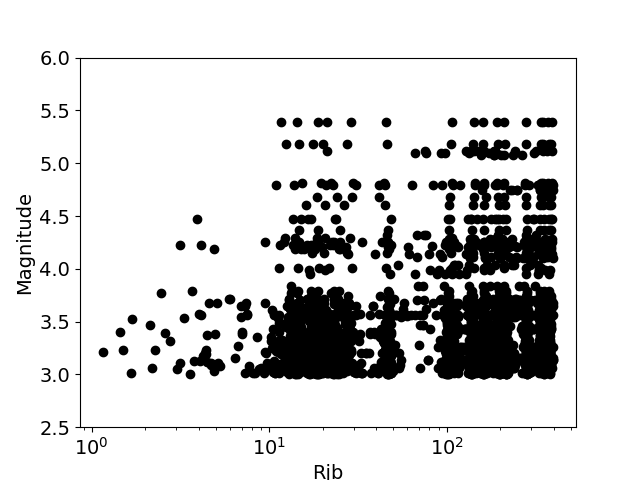

In [17]:
# Input for the figure
fig = plt.figure()
plt.plot(Table['Rjb'], Table['M'], 'ko')

plt.xscale('log') 
plt.rcParams['font.size'] = 14
plt.xlabel('Rjb')
plt.ylabel('Magnitude')
plt.ylim(2.5,6)

plt.show()

#fig.savefig("Data_Distribution.ps")

<IPython.core.display.Javascript object>


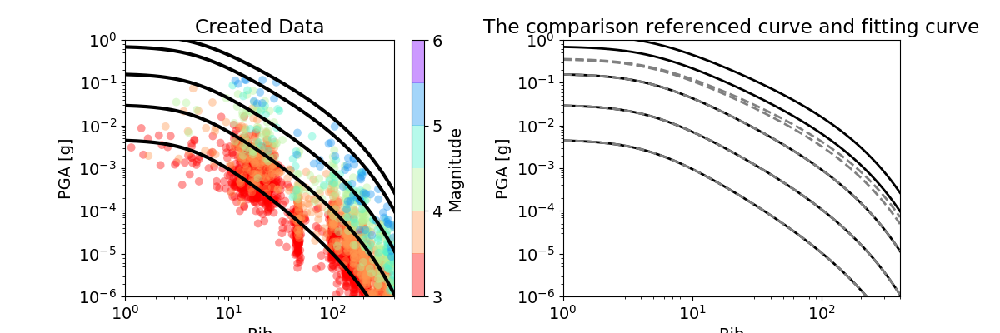

In [147]:
# Input for the figure
color = Table['M']

###--Compare to BSSA14
# 0: PGA, 1: PGV
# BSSA14


# Best fit
# Using Weight function and 2 random effects for both of event and site
# From Stage 1
c3 = -0.007116146

c1 = -1.0359631
c2 = 0.3115953
c3 = -0.007116146
e0 = -1.4738078
e4 = -0.3696208
e5 = -0.2667966

# Create the distance array
h = 4.5
Rjb_ref = np.linspace(0.1,400,4000)
size = len(Rjb_ref)
R = np.sqrt(Rjb_ref**2 + h**2)

BSSA = np.zeros((5,size))
GMPE = np.zeros((5,size))

Mag = [3.0, 4.0, 5.0, 6.0, 6.5]


def BSSA14curveDist(cref, eref, M, R, Mh, Mref, Rref, ref):
    e6 = -0.166
    c1 = cref[0]; c2 = cref[1]; c3 = cref[2]
    e0 = eref[0]; e4 = eref[1]; e5 = eref[2]
    
    if (M > Mh and ref == 'ref'):
        GMPE = np.exp(e0 + e6*(M-Mh) + (c1 + c2*(M-Mref))*np.log(R/Rref) + c3*(R-Rref))
    else:
        GMPE = np.exp(e0 + e4*(M-Mh) + e5*(M-Mh)**2 + (c1 + c2*(M-Mref))*np.log(R/Rref) + c3*(R-Rref))
    return GMPE

def GMPEcurveDist(cref, eref, M, R, Mh, Mref, Rref, ref):
    c1 = cref[0]; c2 = cref[1]; c3 = cref[2]
    e0 = eref[0]; e4 = eref[1]; e5 = eref[2]
    
    GMPE = np.exp(e0 + e4*(M-Mh) + e5*(M-Mh)**2 + (c1 + c2*(M-Mref))*np.log(R/Rref) + c3*(R-Rref))
    return GMPE

Mh = 5.5; Mref = 4.5
Rref = 1.0; h = 4.5

for i in range(len(Mag)):
    BSSA[i] = BSSA14curveDist(cref, eref, Mag[i], R, Mh, Mref, Rref, 'ref')
    GMPE[i] = GMPEcurveDist(cref, eref, Mag[i], R, Mh, Mref, Rref, 'fit')

    
########--- Rjb vs RotD50 comparison between data and fitted GMPE curve ---########
# Color Palette
cpalette = cm.get_cmap('rainbow_r')
#cpalette = mcol.ListedColormap(['blue','lightblue','forestgreen','yellow','red'])     # Define by myself
norm = mcol.BoundaryNorm(np.arange(3,6.5,0.5), cpalette.N)    # For discrete color palette
#np.arrange(min,max,bin)


# Draw Figure
fig = plt.figure(figsize=(12,4))
plt.subplots_adjust(wspace=0.3, hspace=0.3) # Adjust the blank space

# For PGA
plt.subplot(1,2,1)
plt.scatter(Table['Rjb'], np.exp(Table['y']), c=color, s=50, cmap=cpalette, norm=norm, linewidths=0, alpha = 0.4)
for i in range(len(Mag)):
    plt.plot(Rjb_ref, GMPE[i], "k-", linewidth=3)
# Figure setting
plt.xscale('log') 
plt.yscale('log') 
plt.xlim(1,400)
plt.ylim(1e-6,1)    # for PGA
plt.rcParams['font.size'] = 14
plt.xlabel('Rjb')
plt.ylabel('PGA [g]')
plt.title('Created Data')
# Color bar
plt.clim(3,6)
cb = plt.colorbar(label='Magnitude', orientation = 'vertical', ticks=np.linspace(3,6,4))


########--- Rjb vs RotD50 comparison between BSSA14(reference) and fitted GMPE curve ---########
colref = 'gray'
colfit = 'black'

# For PGA
plt.subplot(1,2,2)
for i in range(len(Mag)):
    plt.plot(Rjb_ref, GMPE[i], color=colfit, lw=2)
    plt.plot(Rjb_ref, BSSA[i], color=colref, ls="dashed", lw=2)

# Figure setting
plt.xscale('log') 
plt.yscale('log') 
#plt.xlim(1,1000)
plt.xlim(1,400)
plt.ylim(1e-6,1)   # for PGA
plt.rcParams['font.size'] = 14
plt.xlabel('Rjb')
plt.ylabel('PGA [g]')
plt.title('The comparison referenced curve and fitting curve')

plt.show()



In [148]:
# Get this figure: fig = py.get_figure("https://plot.ly/~etpinard/294/")
# Get this figure's data: data = py.get_figure("https://plot.ly/~etpinard/294/").get_data()
# Add data to this figure: py.plot(Data([Scatter(x=[1, 2], y=[2, 3])]), filename ="s5_hist2dsplt-sites-4-5", fileopt="extend")
# Get y data of first trace: y1 = py.get_figure("https://plot.ly/~etpinard/294/").get_data()[0]["y"]

# Get figure documentation: https://plot.ly/python/get-requests/
# Add data documentation: https://plot.ly/python/file-options/

# If you're using unicode in your file, you may need to specify the encoding.
# You can reproduce this figure in Python with the following code!

# Learn about API authentication here: https://plot.ly/python/getting-started
# Find your api_key here: https://plot.ly/settings/api

from plotly.offline import iplot, init_notebook_mode
import plotly.plotly as py
import plotly.graph_objs as go
import cufflinks as cf
import pandas as pd
import numpy as np # for generating random data


import sys
sys.path.append('/Users/rkiuchi/Dropbox/Python_Code/MyCode/')
sys.path.append('/Users/ryota/Dropbox/Python_Code/MyCode/')
import Plotly_code as Pcode

init_notebook_mode(connected=True) 
cf.set_config_file(offline=True, theme='pearl')

#Convert color bar in Matplotlib
cbar = 'magma'
Cscale = Pcode.MlibCscale_to_Plotly(cbar)


color = Table['y']
x = np.log10(Table['Rjb'])
ticktext = ['0.1','','','','','','','','','1','','','','','','','','','10','','','','','','','','','100','','','400','']
vals = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,80,90,100,200,300,400,500]
tickvals = np.log10(vals)

trace2 = {
  "x": x,
  "y": Table['M'],
    "marker": {
    "color": color, 
    'colorbar': {'title': 'log10(PGA [g])'},
    'colorscale': Cscale,
    "size": 10
  }, 
  "mode": "markers", 
  "name": "", 
  "type": "scatter"
}
trace3 = {
  "x": x,
    "marker": {"color": "rgb(0,120,200)"}, 
  "name": "", 
  "type": "histogram", 
  "xaxis": "x1", 
  "xbins": {
    "end": 3, 
    "size": 0.1, 
    "start": 0
  }, 
  "yaxis": "y2"
}
trace4 = {
  "y": Table['M'],
    "marker": {"color": "rgb(0,120,200)"}, 
  "name": "", 
  "type": "histogram", 
  "xaxis": "x2", 
  "yaxis": "y1", 
  "ybins": {
    "end": 5.6, 
    "size": 0.2, 
    "start": 3.0
  }
}
pdata = go.Data([trace2, trace3, trace4])
layout = {
  "autosize": False, 
  "font": {
    "family": "PT Sans Narrow, sans-serif", 
    "size": 15
  }, 
  "height": 700, 
  "showlegend": False, 
  "title": "Data Distribution", 
  "width": 800, 
  "xaxis": {
    "domain": [0, 0.8], 
    "range": [0, np.log10(500)], 
    'showticklabels': True,
    'mirror': True,
    'ticktext': ticktext,
    'tickvals': tickvals,
    "tickangle": 0,
    "showgrid": True, 
    "showline": True, 
    "showspikes": False, 
    "title": "Rjb [km]", 
    "showgrid": True, 
    "zeroline": False
  }, 
  "xaxis2": {
    "domain": [0.85, 1],
    "dtick": "1", 
    "nticks": 2, 
    "range": [0, 3.2], 
    "showgrid": True, 
    "zeroline": False,
      'type': 'log'
  }, 
  "yaxis": {
    "domain": [0, 0.8], 
    "range": [2.5,6.0], 
    "showgrid": True, 
      "showline": True, 
    "showspikes": False, 
    "title": "Magnitude", 
    "zeroline": True
  }, 
  "yaxis2": {
    "domain": [0.85, 1], 
    "dtick": "1", 
    "nticks": 3, 
    "range": [0, 3.2], 
    "showgrid": True, 
    "zeroline": False,
    'type': 'log'
  }
}
fig = go.Figure(data=pdata, layout=layout)
iplot(fig)